In [1]:
using JLD2
using Plots
using Random
using Distributions

In [2]:
#download files, might be better to run in terminal since 
#run(`gcloud compute scp sandre_google_mit_edu@instance-1:/home/sandre_google_mit_edu/OceanTurb.jl/MCMC_Free_Convection .`)
#run(`gcloud compute scp sandre_google_mit_edu@instance-1:/home/sandre_google_mit_edu/OceanTurb.jl/MCMC_Free_Convection_8.847449617315714e-7 .`)
#run(`gcloud compute scp sandre_google_mit_edu@instance-1:/home/sandre_google_mit_edu/OceanTurb.jl/MCMC_Free_Convection_8.847449617315713e-8 .`)
#run(`gcloud compute scp sandre_google_mit_edu@instance-1:/home/sandre_google_mit_edu/OceanTurb.jl/MCMC_Free_Convection_8.847449617315713e-9 .`)

Process(`gcloud compute scp sandre_google_mit_edu@instance-1:/home/sandre_google_mit_edu/OceanTurb.jl/MCMC_Free_Convection_8.847449617315713e-9 .`, ProcessExited(0))

In [88]:
#@load "MCMC_Free_Convection" #error scale is 0.001
#@load "MCMC_Free_Convection_8.847449617315714e-7" #the last number is the error scale
#the ones below this are complete
#@load "MCMC_Free_Convection_8.847449617315713e-8"
@load "MCMC_Free_Convection_8.847449617315713e-9" #gets stuck at a local minima for a bit

2-element Array{Symbol,1}:
 :error
 :param

In [204]:
max_index = argmax(error)
println("The largest error is ")
println(max_index)
println(error[max_index])
last_index = 1000000
min_index = argmin(error)
println("The smallest error is ")
println(min_index)
println(error[min_index])
#calculate acceptance ratio
println("The acceptance ratio is")
newlist = abs.(error[2:last_index]-error[1:(last_index-1)])
sum(newlist .>0)/length(newlist) #acceptance ratio

The largest error is 
1
8.847449617315714e-7
The smallest error is 
107131
2.8873942101864065e-7
The acceptance ratio is


0.39336239336239337

In [208]:
#=
CSL   :: 1  # Surface layer fraction
Cτ    :: 2  # Von Karman constant
CNL   :: 3  # Non-local flux proportionality constant
Cstab :: 4  # Stable buoyancy flux parameter for wind-driven turbulence
Cunst :: 5  # Unstable buoyancy flux parameter for wind-driven turbulence
Cb_U  :: 6  # Buoyancy flux parameter for convective turbulence
Cτb_U :: skip  # Wind stress parameter for convective turbulence
Cb_T  :: 7  # Buoyancy flux parameter for convective turbulence
Cτb_T :: skip  # Wind stress parameter for convective turbulence
Cd_U  :: 8  # Wind mixing regime threshold for momentum
Cd_T  :: 9  # Wind mixing regime threshold for tracers
CRi   :: 10  # Critical bulk Richardson number
CKE   :: 11  # Unresolved turbulence parameter
CKE₀  :: skip  # Minimum unresolved turbulence kinetic energy
Cn    :: 12  # Exponent for effect of stable buoyancy forcing on wind mixing
Cmτ_U :: 13  # Exponent for effect of unstable buoyancy forcing on wind mixing of U
Cmτ_T :: 14  # Exponent for effect of unstable buoyancy forcing on wind mixing of T
Cmb_U :: 15  # Exponent for effect of wind on convective mixing of U
Cmb_T :: 16  # Exponent for effect of wind on convective mixing of T
KU₀   :: skip  # Interior viscosity for velocity
KT₀   :: skip  # Interior diffusivity for temperature
KS₀   :: skip  # Interior diffusivity for salinity
=#
#[1 3 7 10]
index_dictionary = Dict([(1,"Surface layer fraction"), (3,"non-local flux"),(7,"Buoyancy flux"),(10,"Richardson number")])
ind = 7
#range = 500000:700000
#range = 700000:900000
#range = 1:1000000
range = 1:1000000
burnin = 1*10^5
range = burnin:1000000 #discard burn in
min_p1 = minimum(param[ind,range])
max_p1 = maximum(param[ind,range])
dsp1 = (max_p1 - min_p1) / 100
bins = collect(min_p1:dsp1:max_p1)
println("The standard deviation is ")
println(std(param[ind,range]))
println("The mean is ")
println(mean(param[ind,range]))
p1 = histogram(param[ind,range],normalize=true,bins = bins,legend=false,xlabel=index_dictionary[ind], ylabel="marginal pdf")
p2 = plot(param[ind,range], ylabel = index_dictionary[ind], xlabel = "iteration", legend=false)
plot(p1,p2)

The standard deviation is 
0.47804965551856937
The mean is 
1.5495720637696193


In [209]:
println("starting error")
println(error[1])
println("starting parameters")
println(param[[1; 3; 7; 10;],1])


starting error
8.847449617315714e-7
starting parameters
[0.1, 6.33, 1.36, 0.3]


In [210]:
println(error[min_index])
println(param[[1; 3; 7; 10;],min_index])
println("The improvement is ")
println(error[1]/error[min_index])

2.8873942101864065e-7
[0.0148013, 4.04226, 1.50152, 0.265932]
The improvement is 
3.0641640778051342


4×4 Array{Float64,2}:
  0.00108084    0.00624969   -0.00758403  -0.000102459
  0.00624969    0.0647016    -0.0178462   -0.000275657
 -0.00758403   -0.0178462     0.21601     -6.38932e-5 
 -0.000102459  -0.000275657  -6.38932e-5   8.89805e-5 

The covariance matrix of the parameters are above


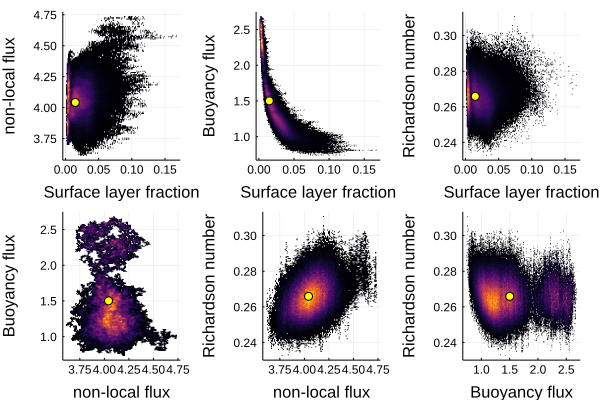

In [211]:
cparam = transpose(param);
println("The covariance matrix of the parameters are above")
println("These capture the parameter sensitivities (especially on the diagonal)")
#seems that the richardson number is the most sensitive parameter and the bouyancy flux is the most insensitive parameter
display(cov(cparam[:,[1; 3; 7; 10;]]))
burnin = 1*10^5
range = burnin:1000000 #discard burn in

nbins = 200
#first covariance
xstring = "Surface layer fraction"
ystring = "non-local flux"
#scatter(param[[1;3;],min_index],legend=false,color="yellow")
histogram2d(param[1,range],param[3,range],normalize=true,legend=false,nbins=nbins, xlabel = xstring, ylabel = ystring)
p13 = scatter!([param[1,min_index]],[param[3,min_index]],legend=false,color="yellow",label="maximum")
xstring = "Surface layer fraction"
ystring = "Buoyancy flux"
histogram2d(param[1,range],param[7,range],normalize=true,legend=false,nbins=nbins, xlabel = xstring, ylabel = ystring)
p17 = scatter!([param[1,min_index]],[param[7,min_index]],legend=false,color="yellow",label="maximum")
xstring = "Surface layer fraction"
ystring = "Richardson number"
histogram2d(param[1,range],param[10,range],normalize=true,legend=false,nbins=nbins, xlabel = xstring, ylabel = ystring)
p110 = scatter!([param[1,min_index]],[param[10,min_index]],legend=false,color="yellow",label="maximum")
xstring = "non-local flux"
ystring = "Buoyancy flux"
p37 = histogram2d(param[3,range],param[7,range],normalize=true,legend=false,nbins=nbins, xlabel = xstring, ylabel = ystring)
p37 = scatter!([param[3,min_index]],[param[7,min_index]],legend=false,color="yellow",label="maximum")
xstring = "non-local flux"
ystring = "Richardson number"
p310 = histogram2d(param[3,range],param[10,range],normalize=true,legend=false,nbins=nbins, xlabel = xstring, ylabel = ystring)
p310 = scatter!([param[3,min_index]],[param[10,min_index]],legend=false,color="yellow",label="maximum")
xstring = "Buoyancy flux"
ystring = "Richardson number"
p710 = histogram2d(param[7,range],param[10,range],normalize=true,legend=false,nbins=nbins, xlabel = xstring, ylabel = ystring)
p710 = scatter!([param[7,min_index]],[param[10,min_index]],legend=false,color="yellow",label="maximum")

plot(p13, p17, p110, p37, p310, p710)

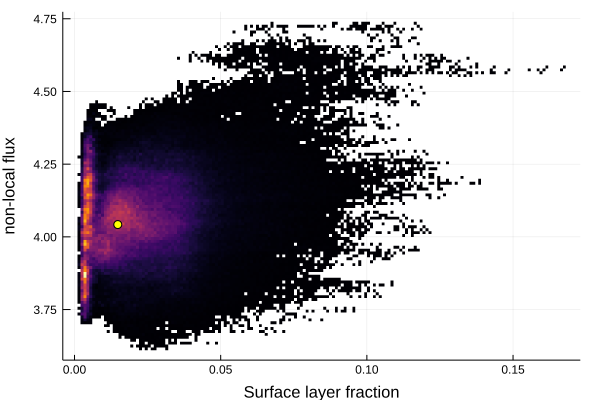

In [193]:
p13

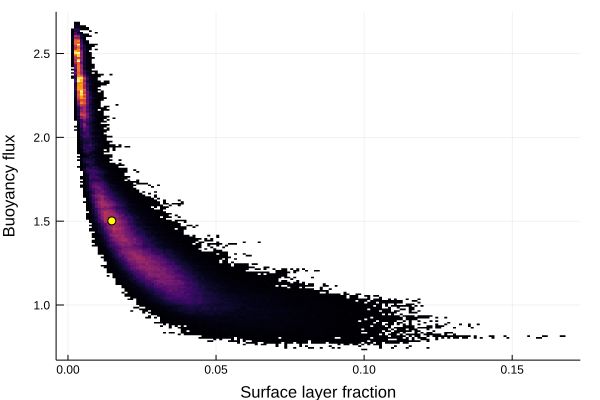

In [194]:
p17 

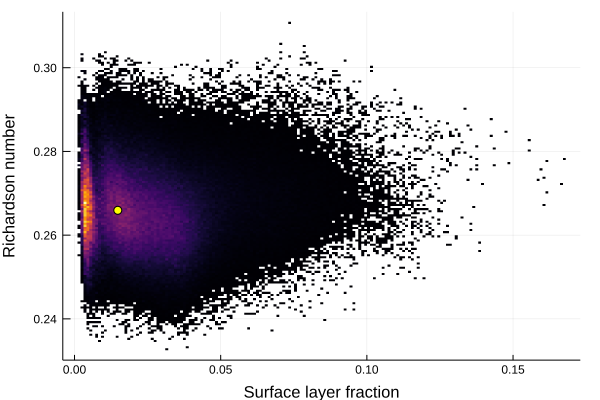

In [212]:
p110

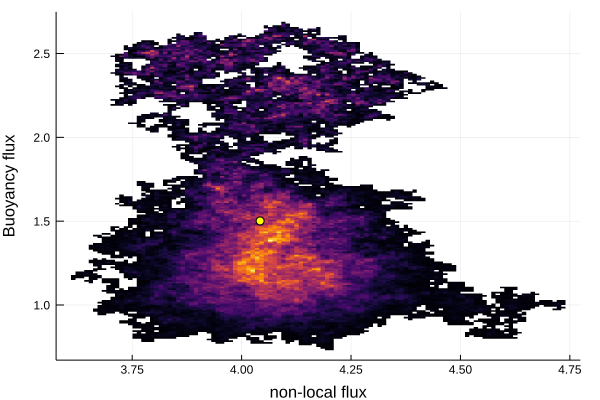

In [213]:
p37

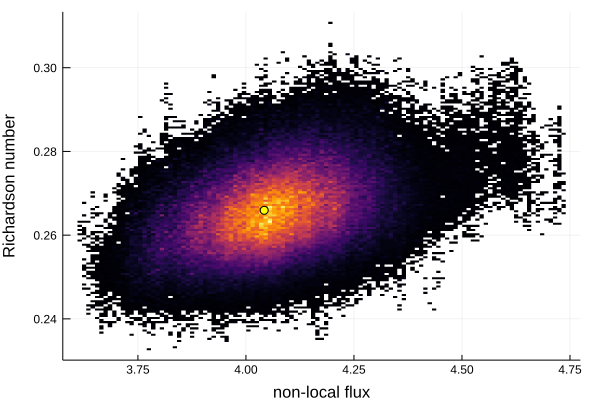

In [214]:
p310

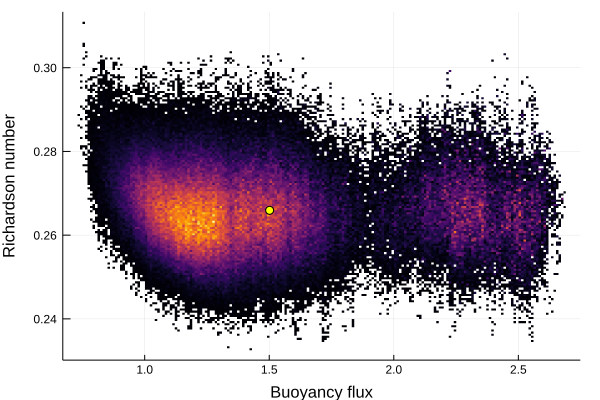

In [215]:
p710